# Đảo ảnh

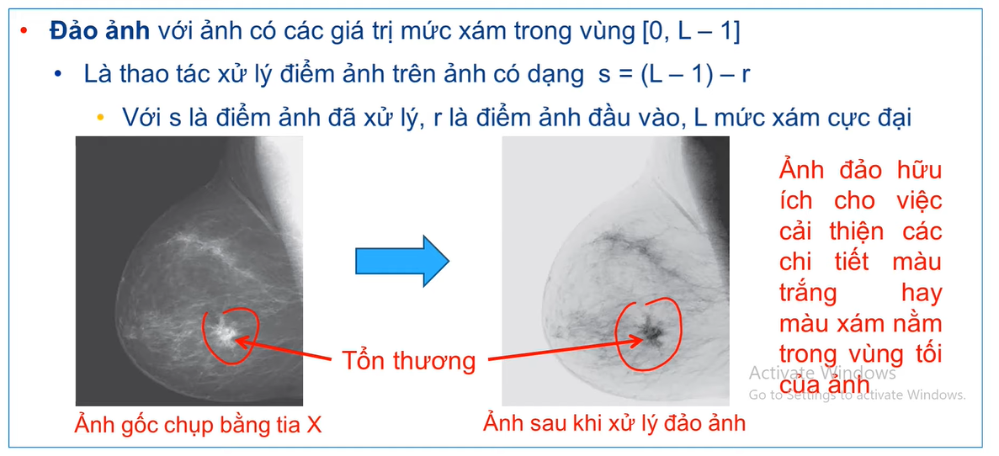

In [93]:
import cv2
import matplotlib.pyplot as plt

In [9]:
img = cv2.imread('img1.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

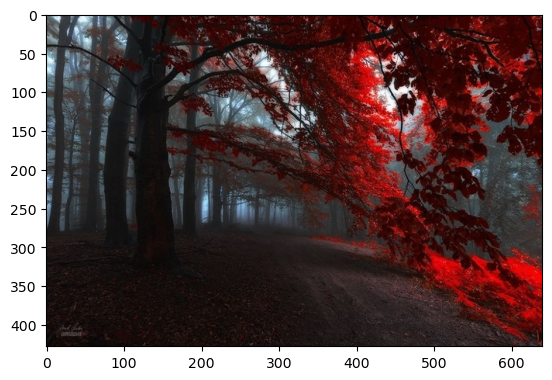

In [10]:
plt.imshow(img)
plt.show()

In [11]:
def dao_anh(img):
    return 255 - img

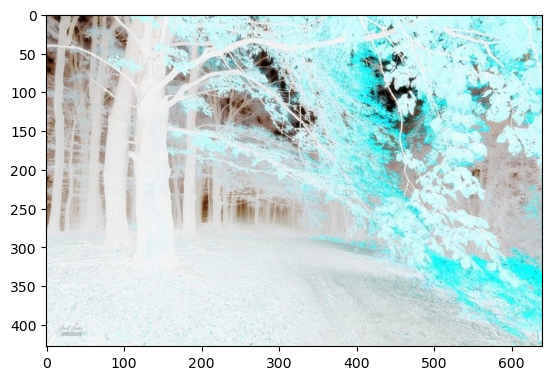

In [12]:
plt.imshow(dao_anh(img))
plt.show()

# Phép biến đổi Logarit

In [13]:
def Chuyen_doi_logarit(img, c):
    return float(c) * cv2.log(1.0 + img)

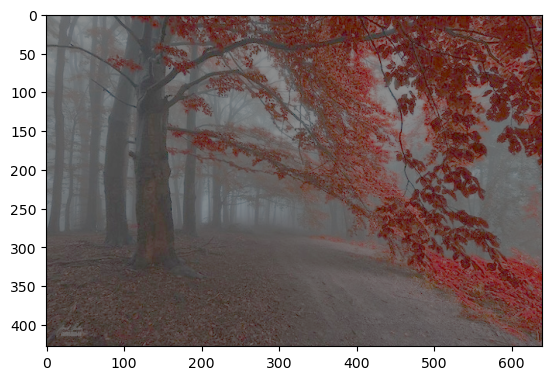

In [18]:
plt.imshow(Chuyen_doi_logarit(img, 0.1))
plt.show()

# Biến đổi gamma

In [19]:
def Chuyen_Doi_Gamma(img, gamma, c): # s = c * r^gamma
    return float(c) * pow(img, float(gamma))

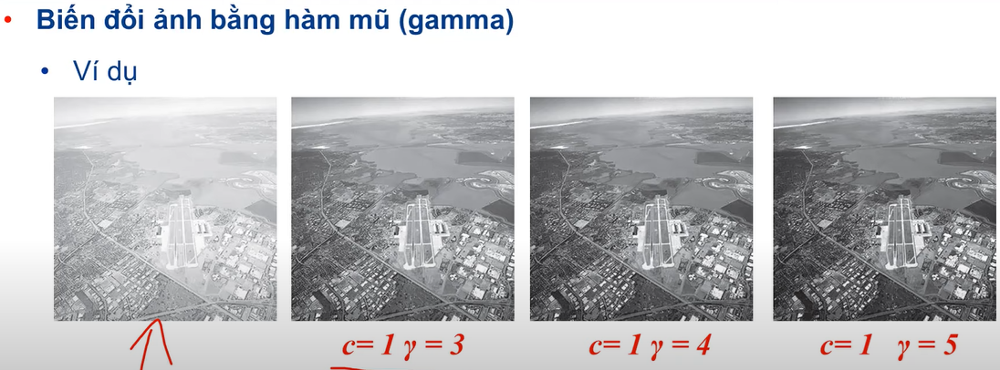

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


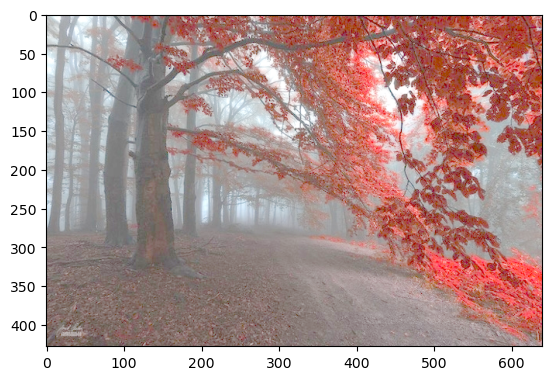

In [24]:
plt.imshow(Chuyen_Doi_Gamma(img, 0.3, 0.2))
plt.show()

# Cắt ngưỡng

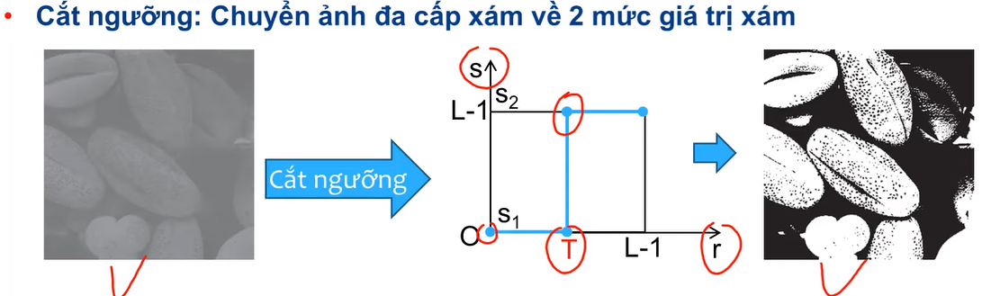

In [51]:
def cat_nguong(img, th):
    return (img > th)*255

In [62]:
img = cv2.imread('img2.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

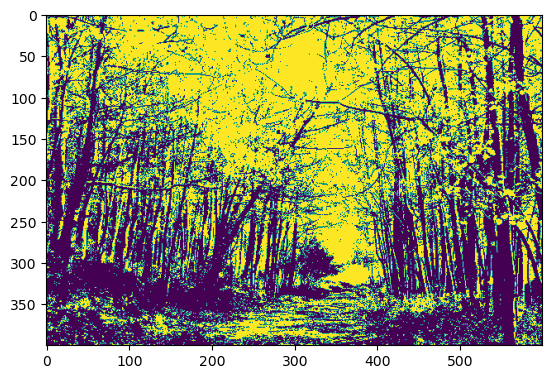

In [63]:
plt.imshow(cat_nguong(img, 117))
plt.show()

In [59]:
cat_nguong(img, 117)

array([[[  0,   0,   0],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255,   0],
        [255,   0,   0],
        [255,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [255, 255,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[255, 255, 255],
        [255, 255,   0],
        [255, 255, 255],
        ...,
        [255, 255,   0],
        [  0,   0,   0],
        [255, 255,   0]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [255,   0,   0],
        ...,
        [255,   0,   0],
        [255,   0,   0],
        [255,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [255,   0,   0],
        [255,   0,   0],
        [255,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [255,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]]

# Lát cắt mặt phẳng Bit

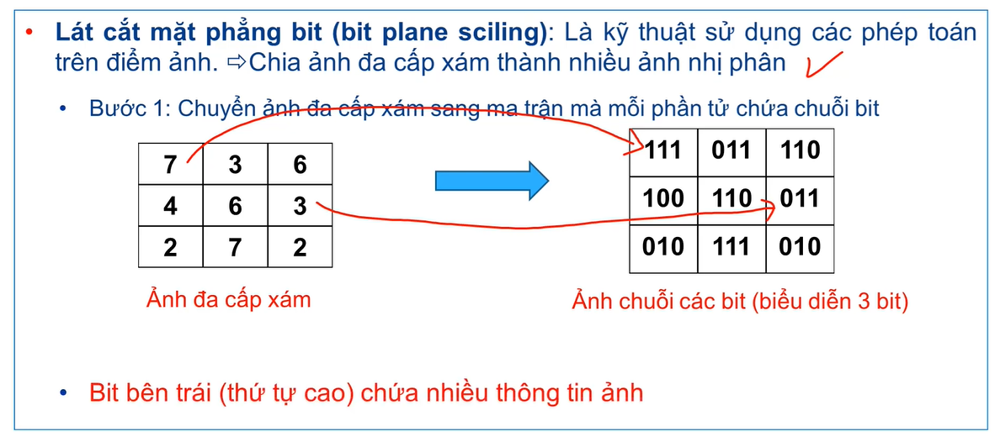

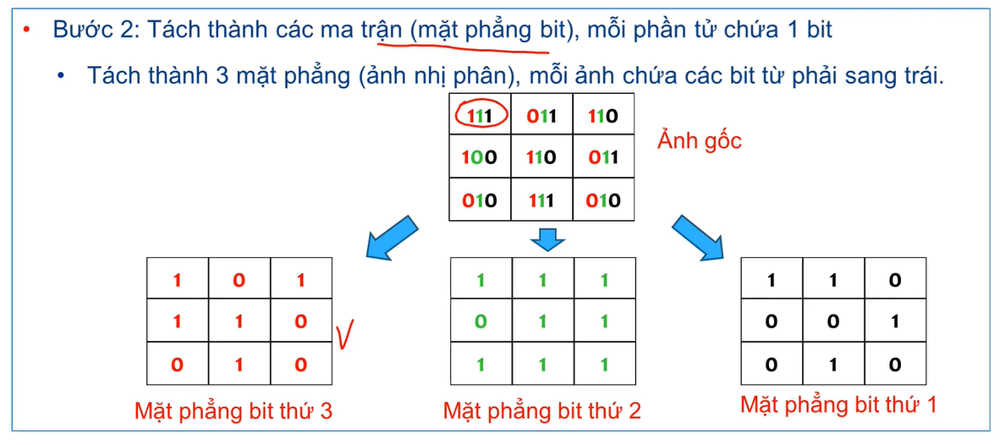

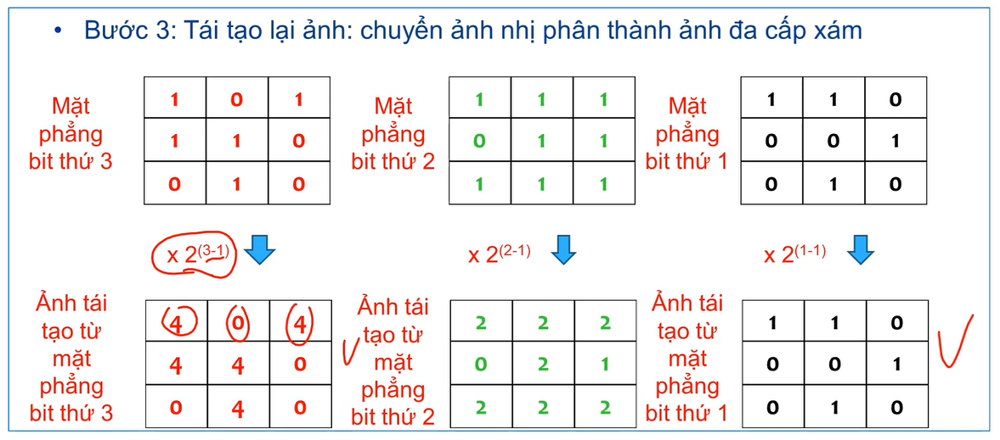

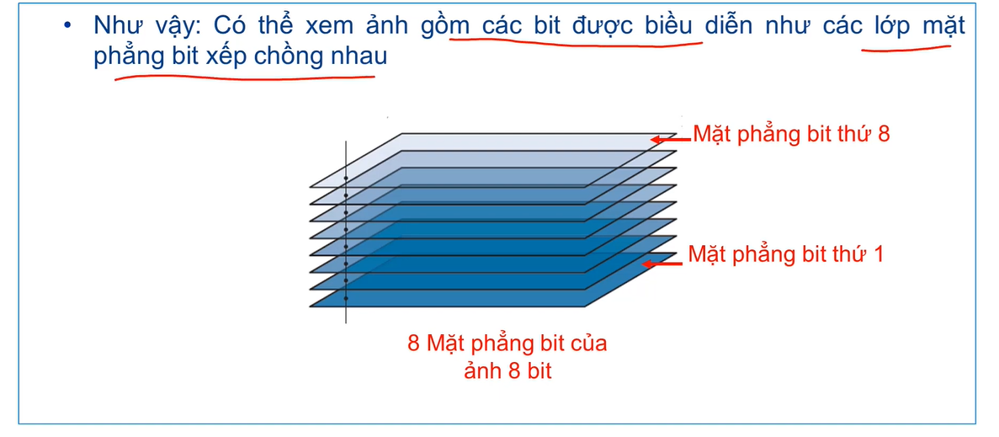

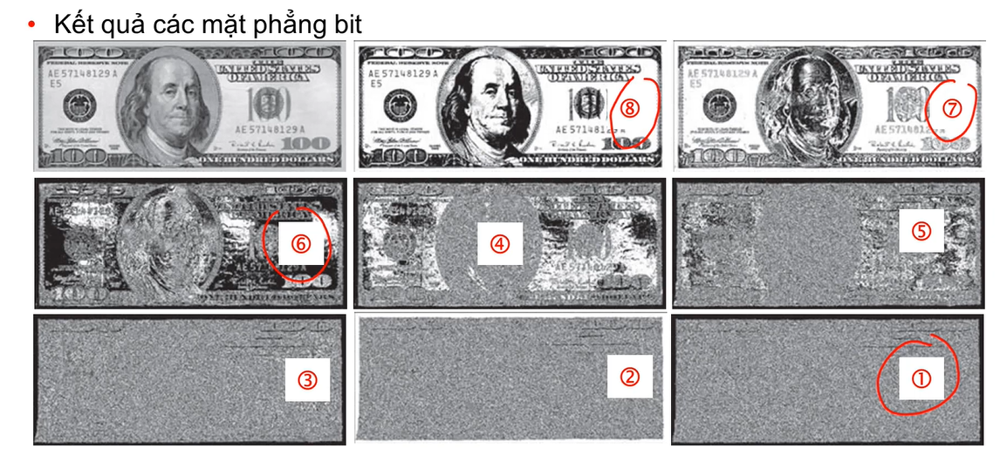

In [9]:
img = cv2.imread('img3.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # [(B, G, R)]=>([0-255])

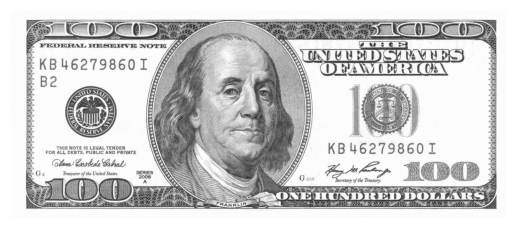

In [56]:
plt.imshow(img, cmap='gray')
plt.axis('off')
plt.show()

In [5]:
import numpy as np

In [11]:
lst = []
for i in range(img.shape[0]):
    for j in range(img.shape[1]):
        lst.append(np.binary_repr(img[i][j], width = 8))

In [13]:
lst[:5]

['11111110', '11111111', '11111111', '11111110', '11111110']

In [14]:
mp_bit_n = []

In [33]:
for i in range(8):
    mp_bit = []
    for bit in lst:
        mp_bit.append(int(bit[7-i]))
    mp_bit_n.append(mp_bit)

In [34]:
mp_bit_n[0][:10]

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

In [38]:
img_bit_n = [(np.array(mp_bit_n[7 - i], dtype='uint8')*2**i).reshape(img.shape[0], img.shape[1]) for i in range(8)]

In [39]:
img_bit_n[0]

array([[0, 1, 1, ..., 1, 1, 1],
       [0, 1, 1, ..., 1, 1, 1],
       [0, 1, 1, ..., 1, 1, 1],
       ...,
       [0, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0]], dtype=uint8)

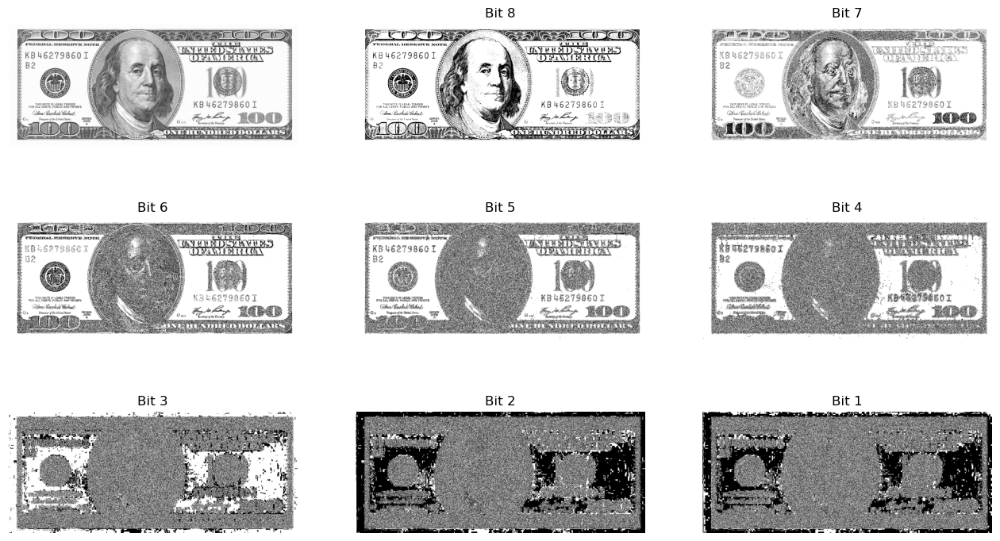

In [55]:
fig = plt.figure(figsize=(16, 9))
plt.subplot(3, 3, 1)
plt.imshow(img, cmap='gray')
plt.axis('off')

for i in range(8):
    plt.subplot(3, 3, 11 - (i + 2))
    plt.imshow(img_bit_n[i], cmap='gray')
    plt.title(f'Bit {i+1}')
    plt.axis('off')

plt.show()    

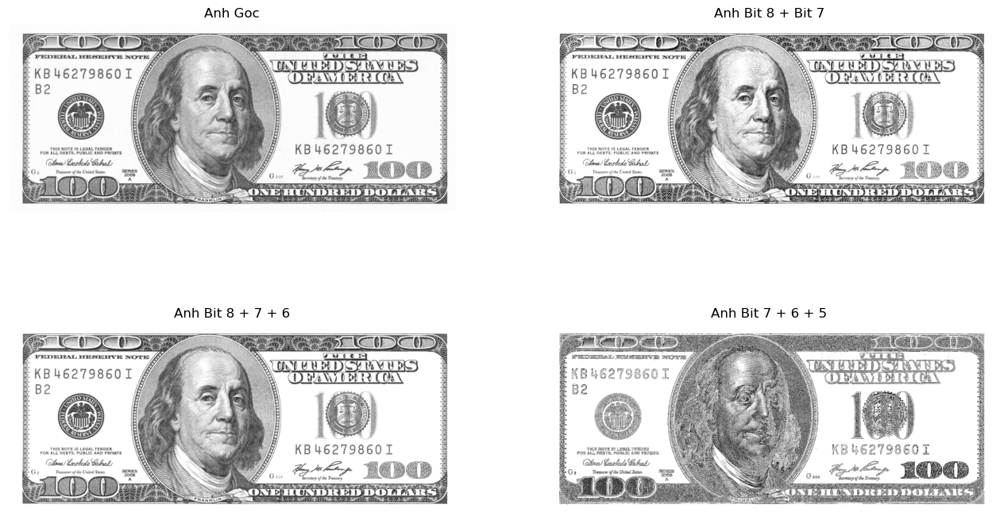

In [53]:
fig = plt.figure(figsize=(16, 9))
# anh goc
plt.subplot(2, 2, 1)
plt.title('Anh Goc')
plt.imshow(img, cmap='gray')
plt.axis('off')

#anh bit thu 8 va bit thu 7
plt.subplot(2, 2, 2)
plt.title('Anh Bit 8 + Bit 7')
plt.imshow(img_bit_n[7] + img_bit_n[6], cmap='gray')
plt.axis('off')

#anh bit thu 8, bit thu 7 va bit thu 6
plt.subplot(2, 2, 3)
plt.title('Anh Bit 8 + 7 + 6')
plt.imshow(img_bit_n[7] + img_bit_n[6] + img_bit_n[5], cmap='gray')
plt.axis('off')

#anh bit thu 7, bit thu 6 va bit thu 5
plt.subplot(2, 2, 4)
plt.title('Anh Bit 7 + 6 + 5')
plt.imshow(img_bit_n[4] + img_bit_n[6] + img_bit_n[5], cmap='gray')
plt.axis('off')


plt.show()    

# Kĩ thuật lọc mịn ảnh (lọc thông thấp)

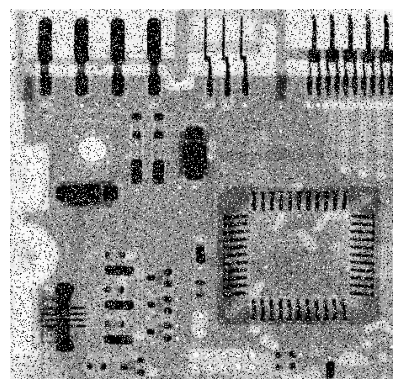

In [123]:
img = cv2.imread('test2.tif')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.imshow(img,cmap='gray')
plt.axis('off')
plt.show()

In [150]:
def Tich_chap(img, mask):
    m, n = img.shape[0], img.shape[1]
    lenM = len(mask)
    img_new = np.zeros([m, n])
    for i in range(lenM//2, m - lenM//2):
        for j in range(lenM//2, n - lenM//2):
            temp = img[i-1][j-1] * mask[0][0]
            for l in range(-1, lenM - 1):
                for k in range(-1, lenM - 1):
                    if l!=-1 and k !=-1:
                        temp = temp + img[i + l][j + k] * mask[l + 1][k + 1]
            img_new[i][j] = temp

     
    return img_new.astype(np.uint8)
    

In [134]:
# lọc trung bình
locTB = np.array(([1/9, 1/9, 1/9],[1/9, 1/9, 1/9], [1/9, 1/9, 1/9]), dtype = 'float')
#lọc trung bình trọng số
locTB_TS = np.array(([1/16, 2/16, 1/16],[2/16, 4/16, 2/16], [1/16, 2/16, 1/16]), dtype = 'float')
#lọc gausian
locGaussian = np.array(([0.0751/4.8976, 0.1238/4.8976, 0.0751/4.8976],
                        [0.1238/4.8976, 0.2042/4.8976, 0.1238/4.8976],
                        [0.0751/4.8976, 0.1238/4.8976, 0.0751/4.8976]), dtype = 'float')

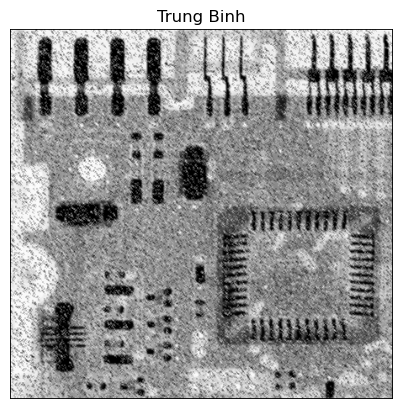

In [151]:
plt.imshow(Tich_chap(img, locTB), cmap='gray')
plt.axis('off')
plt.title('Trung Binh')
plt.show()

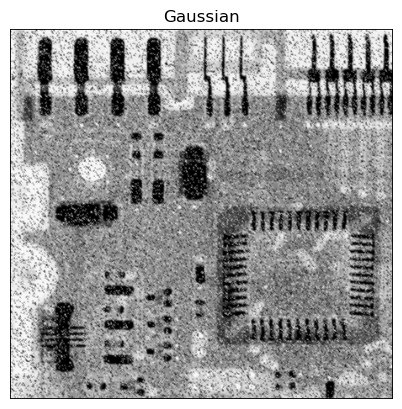

In [152]:
plt.imshow(Tich_chap(img, locGaussian), cmap='gray')
plt.axis('off')
plt.title('Gaussian')
plt.show()

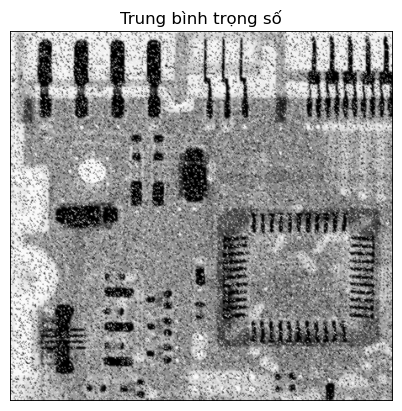

In [153]:
plt.imshow(Tich_chap(img, locTB_TS), cmap='gray')
plt.axis('off')
plt.title('Trung bình trọng số')
plt.show()

In [140]:
def Loc_trung_vi(img, lenM):
    m, n = img.shape[0], img.shape[1]
    img_new = np.zeros([m, n])
    for i in range(lenM//2, m - lenM//2):
        for j in range(lenM//2, n - lenM//2):
            temp = []
            for l in range(-1, lenM - 1):
                for k in range(-1, lenM - 1):
                        temp.append(img[i + l][j + k])
            temp= sorted(temp)
            img_new[i][j] = temp[len(temp)//2]

     
    return img_new.astype(np.uint8)
    

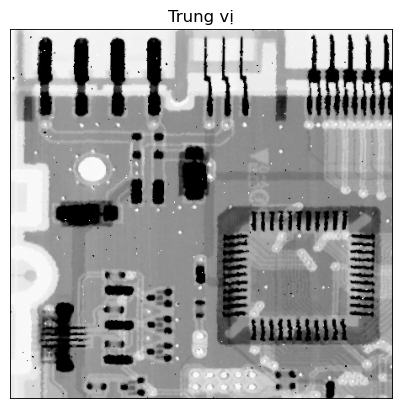

In [141]:
plt.imshow(Loc_trung_vi(img, 3), cmap='gray')
plt.axis('off')
plt.title('Trung vị')
plt.show()

In [148]:
def Loc_max(img, lenM):
    m, n = img.shape[0], img.shape[1]
    img_new = np.zeros([m, n])
    for i in range(lenM//2, m - lenM//2):
        for j in range(lenM//2, n - lenM//2):
            temp = img[i][j]
            for l in range(-1, lenM - 1):
                for k in range(-1, lenM - 1):
                        temp = max(temp, img[i + l][j + k])
            img_new[i][j] = temp

     
    return img_new.astype(np.uint8)

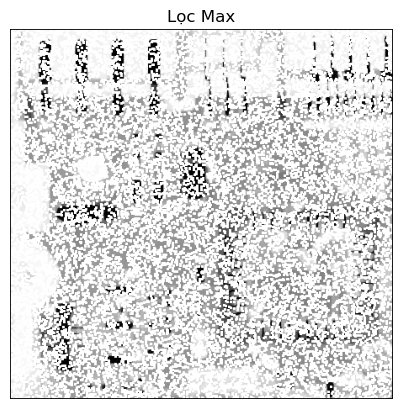

In [149]:
plt.imshow(Loc_max(img, 3), cmap='gray')
plt.axis('off')
plt.title('Lọc Max')
plt.show()

# Lọc sắc nét ảnh

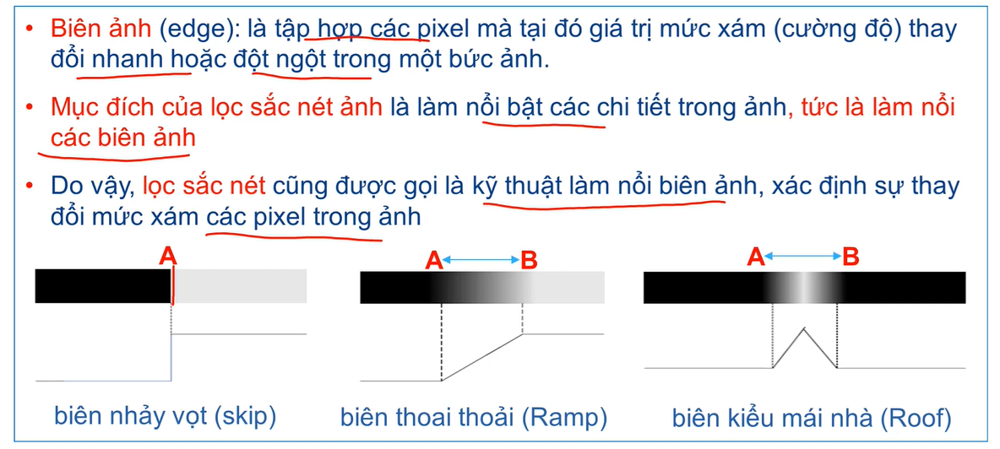

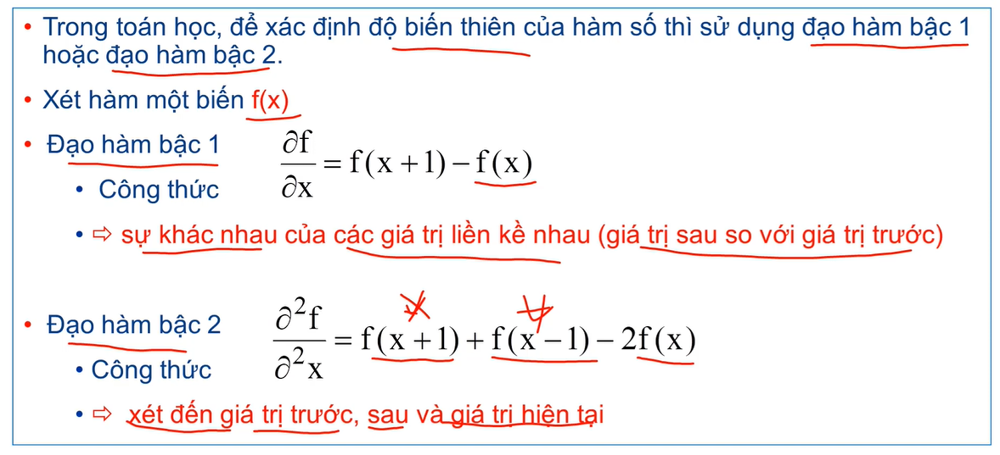

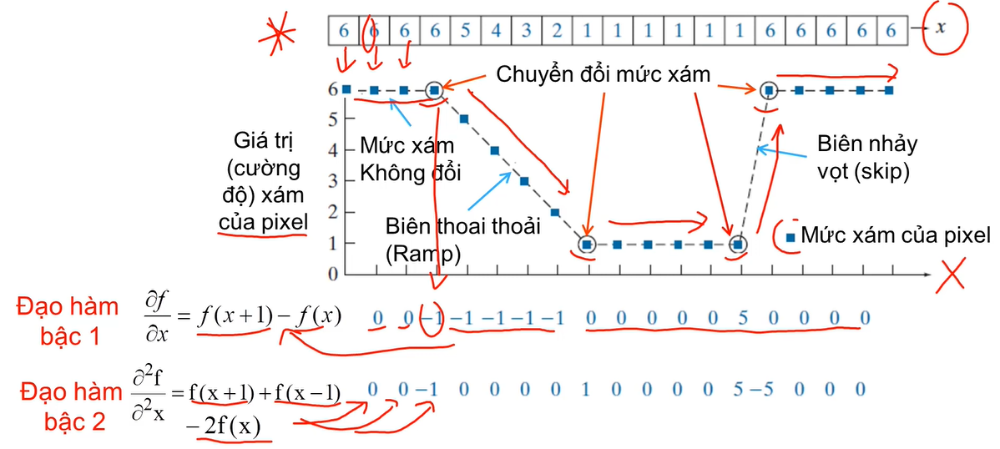

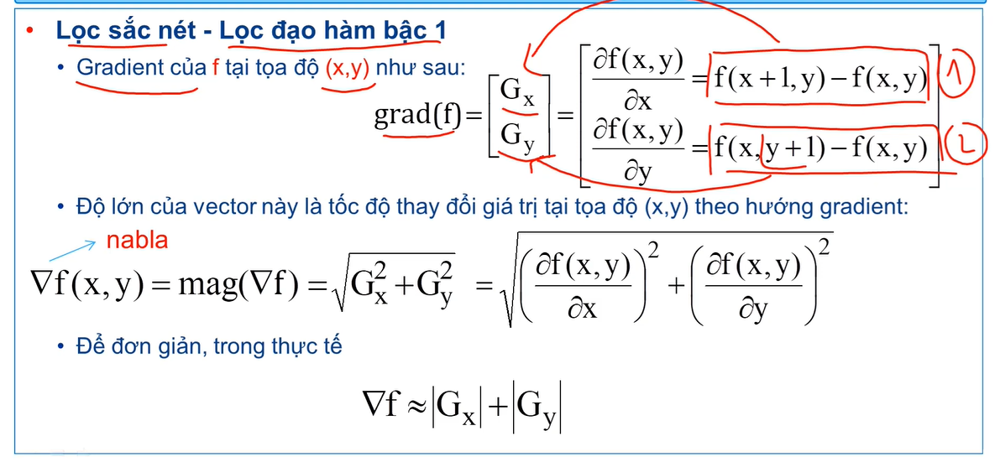

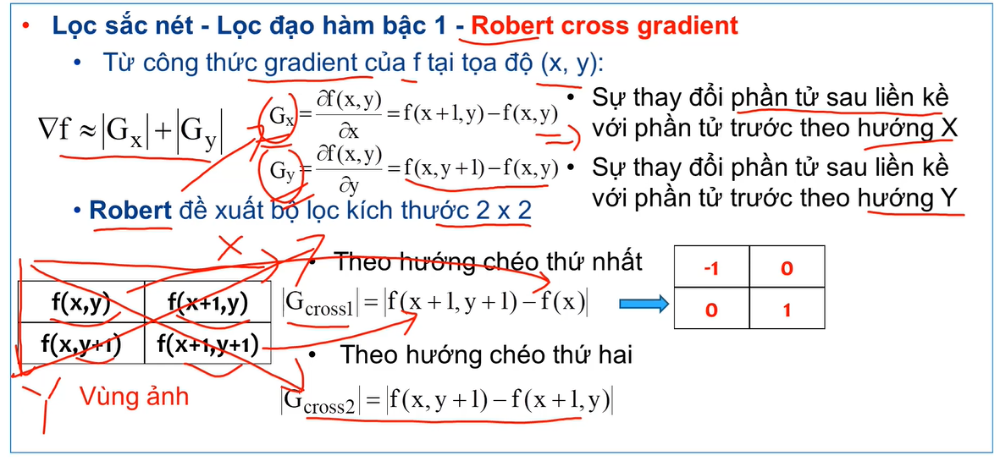

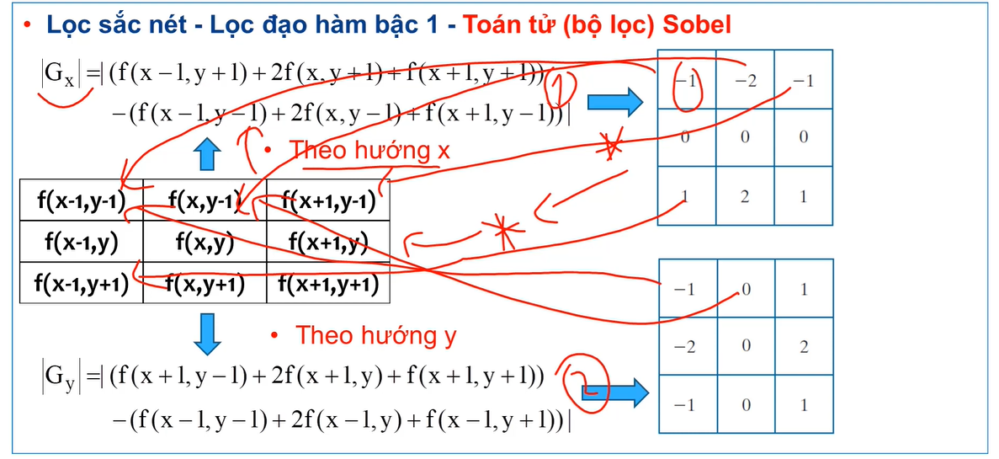

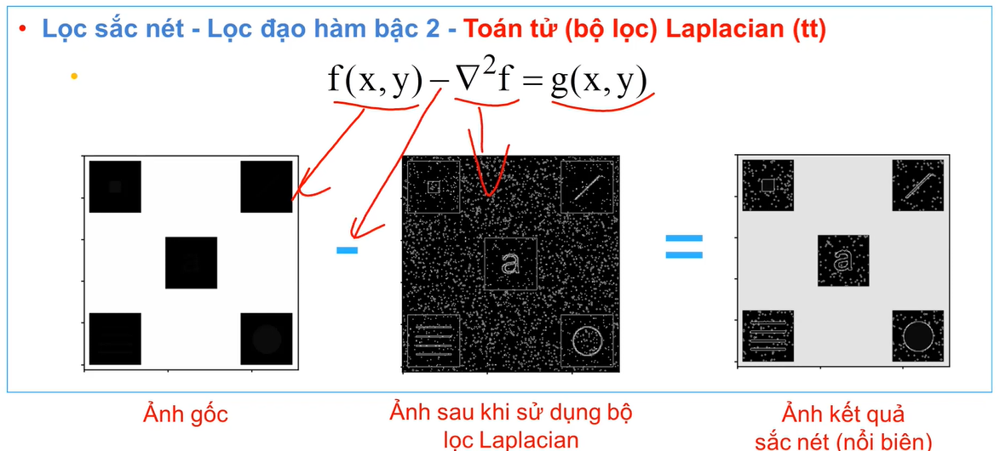

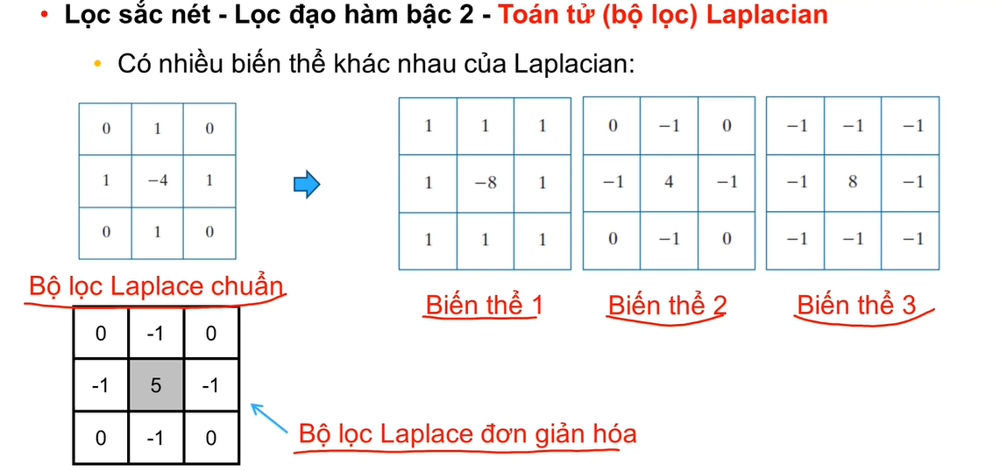

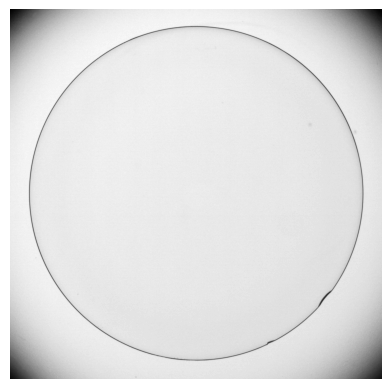

In [174]:
img = cv2.imread('test1.tif')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.imshow(img,cmap='gray')
plt.axis('off')
plt.show()

In [155]:
loc_Robert_Cross1=np.array(([0, 0, 0],
                            [0, -1, 0],
                            [0, 0, 1]), dtype = "float")

loc_Robert_Cross2=np.array(([0, 0, 0],
                            [0, 0, -1],
                            [0, 1, 0]), dtype = "float")

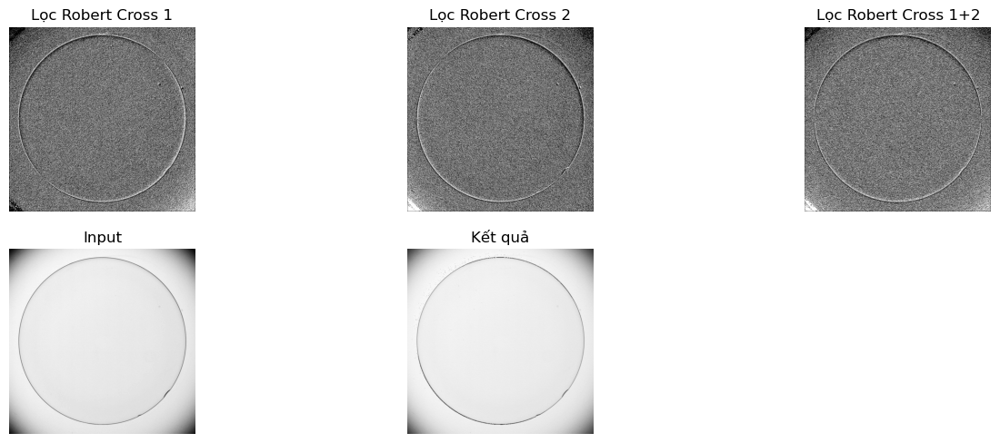

In [175]:
img_R1 = Tich_chap(img, loc_Robert_Cross1)
img_R2 = Tich_chap(img, loc_Robert_Cross2)
img_R12 = img_R1 + img_R2

fig = plt.figure(figsize=(16, 9))
plt.subplot(3, 3, 1)
plt.imshow(img_R1, cmap='gray')
plt.axis('off')
plt.title('Lọc Robert Cross 1')

plt.subplot(3, 3, 2)
plt.imshow(img_R2, cmap='gray')
plt.axis('off')
plt.title('Lọc Robert Cross 2')

plt.subplot(3, 3, 3)
plt.imshow(img_R12, cmap='gray')
plt.axis('off')
plt.title('Lọc Robert Cross 1+2')

plt.subplot(3, 3, 5)
plt.imshow(img_R12 + img, cmap='gray')
plt.axis('off')
plt.title('Kết quả')

plt.subplot(3, 3, 4)
plt.imshow(img, cmap='gray')
plt.axis('off')
plt.title('Input')

plt.show()

# Sobel

In [162]:
locSobelX = np.array(([-1,-2, -1], [0, 0, 0], [1, 2, 1]), dtype='float')
locSobelY = np.array(([-1,0, 1], [-2, 0, 2], [1, 0, 1]), dtype='float')

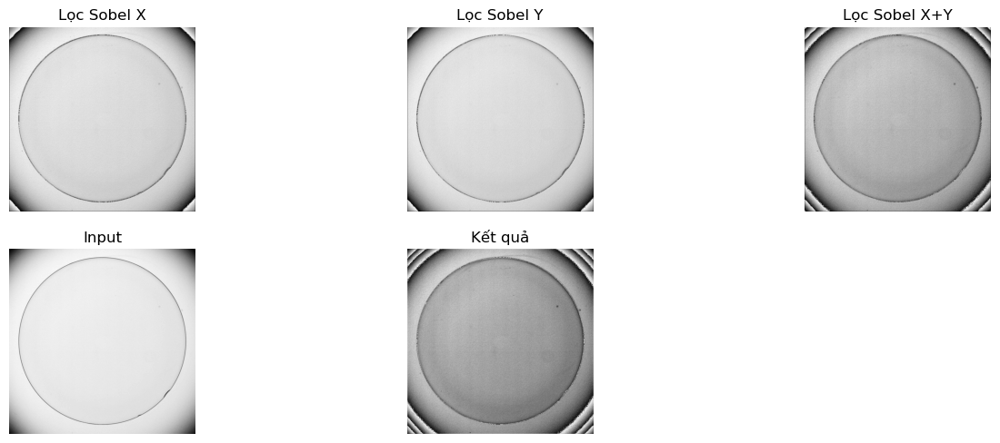

In [176]:
img_SX = Tich_chap(img, locSobelX)
img_SY = Tich_chap(img, locSobelY)
img_SXY = img_SX + img_SY

fig = plt.figure(figsize=(16, 9))
plt.subplot(3, 3, 1)
plt.imshow(img_SX, cmap='gray')
plt.axis('off')
plt.title('Lọc Sobel X')

plt.subplot(3, 3, 2)
plt.imshow(img_SY, cmap='gray')
plt.axis('off')
plt.title('Lọc Sobel Y')

plt.subplot(3, 3, 3)
plt.imshow(img_SXY, cmap='gray')
plt.axis('off')
plt.title('Lọc Sobel X+Y')

plt.subplot(3, 3, 5)
plt.imshow(img_SXY + img, cmap='gray')
plt.axis('off')
plt.title('Kết quả')

plt.subplot(3, 3, 4)
plt.imshow(img, cmap='gray')
plt.axis('off')
plt.title('Input')

plt.show()

# LapLacian

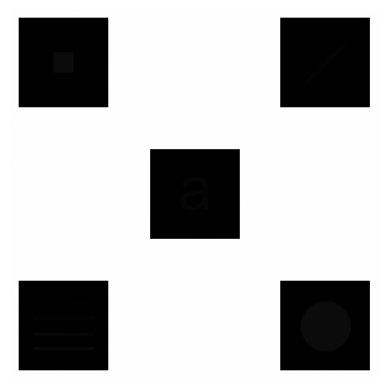

In [178]:
img = cv2.imread('test3.tif')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.imshow(img,cmap='gray')
plt.axis('off')
plt.show()

In [168]:
locLaplacian_chuan = np.array(([0, 1, 0],
                               [1, -4, 1],
                               [0, 1, 0]), dtype = 'float')
locLaplacian_BienThe1 = np.array(([1, 1, 1],
                               [1, -8, 1],
                               [1, 1, 1]), dtype = 'float')

locLaplacian_BienThe2 = np.array(([0, -1, 0],
                               [-1, 4, -1],
                               [0, -1, 0]), dtype = 'float')
locLaplacian_BienThe3 = np.array(([-1, -1, -1],
                               [-1, 8, -1],
                               [-1, -1, -1]), dtype = 'float')
locLaplacian_CaiThien = np.array(([-1, -1, -1],
                               [-1, 5, -1],
                               [-1, -1, -1]), dtype = 'float')

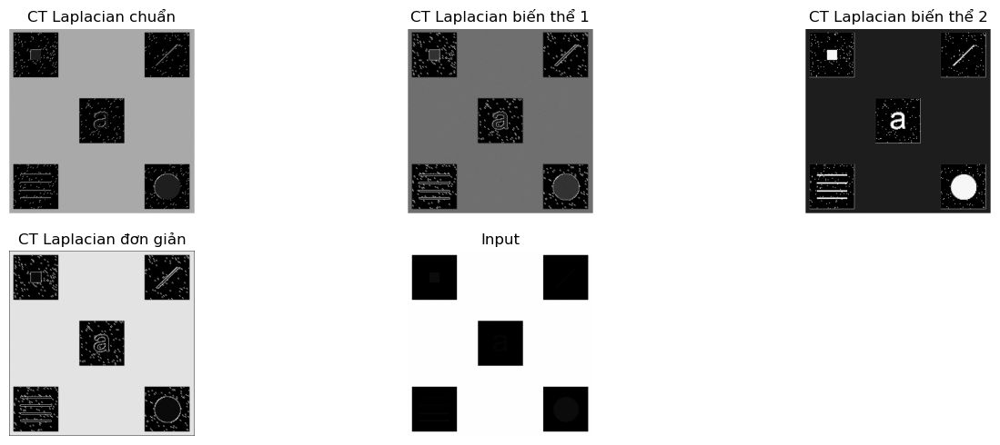

In [179]:
img_LC = Tich_chap(img, locLaplacian_chuan)
img_CTLC = img - img_LC

img_BT1 = Tich_chap(img, locLaplacian_BienThe1)
img_CTBT1 = img - img_BT1

img_BT2 = Tich_chap(img, locLaplacian_BienThe2)
img_CTBT2 = img - img_BT2

img_CT = Tich_chap(img, locLaplacian_CaiThien)

fig = plt.figure(figsize=(16, 9))
plt.subplot(3, 3, 1)
plt.imshow(img_CTLC, cmap='gray')
plt.axis('off')
plt.title('CT Laplacian chuẩn')

plt.subplot(3, 3, 2)
plt.imshow(img_CTBT1, cmap='gray')
plt.axis('off')
plt.title('CT Laplacian biến thể 1')

plt.subplot(3, 3, 3)
plt.imshow(img_CTBT2, cmap='gray')
plt.axis('off')
plt.title('CT Laplacian biến thể 2')

plt.subplot(3, 3, 4)
plt.imshow(img_CT, cmap='gray')
plt.axis('off')
plt.title('CT Laplacian đơn giản')

plt.subplot(3, 3, 5)
plt.imshow(img, cmap='gray')
plt.axis('off')
plt.title('Input')

plt.show()